In [1]:
#Importing the basic librarires

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
sns.set_style('whitegrid')
import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline

### Importing dataset

In [2]:
df = pd.read_csv('Walmart DataSet.csv')

In [3]:
df.head(2)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106


In [4]:
df.tail(2)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6433,45,19-10-2012,718125.53,0,56.47,3.969,192.330854,8.667
6434,45,26-10-2012,760281.43,0,58.85,3.882,192.308899,8.667


### Exploring the Dataset

In [5]:
df.shape

(6435, 8)

### Cheak Null Values in Dataset

In [6]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


### Need to convert the datatype of Date colum to datetime

In [8]:
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df.index = df['Date']


In [9]:
df.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


## a. If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?

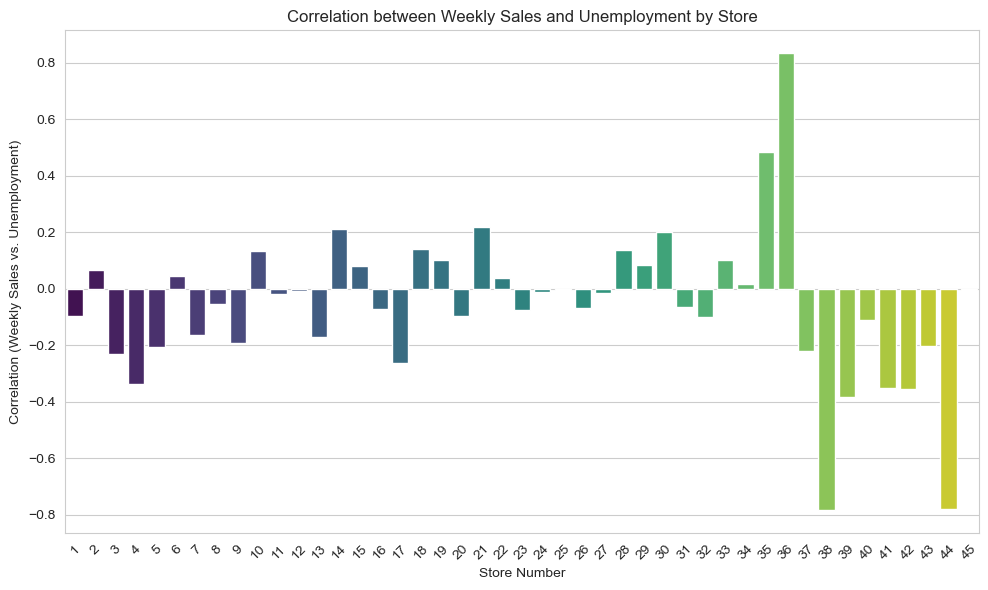

In [10]:
# Calculate the correlation between weekly sales and unemployment rate for each store
correlation_by_store = df.groupby('Store')[['Weekly_Sales', 'Unemployment']].corr().iloc[0::2, -1].reset_index()
correlation_by_store = correlation_by_store.rename(columns={'Unemployment': 'Correlation'})

# Sort stores by the strength of correlation (negative values indicate a negative correlation)
most_affected_stores = correlation_by_store.sort_values(by='Correlation', ascending=True)

# Create a scatter plot to visualize the relationship
plt.figure(figsize=(10, 6))
#plt.scatter(most_affected_stores['Store'], most_affected_stores['Correlation'], marker='o', color='b')
sns.barplot(data=most_affected_stores, x='Store', y='Correlation', palette='viridis')

plt.xlabel('Store Number')
plt.ylabel('Correlation (Weekly Sales vs. Unemployment)')
plt.title('Correlation between Weekly Sales and Unemployment by Store')
plt.xticks(rotation=45)  # Rotate store numbers for better readability
#plt.grid(True)

# Show the scatter plot
plt.tight_layout()
plt.show()

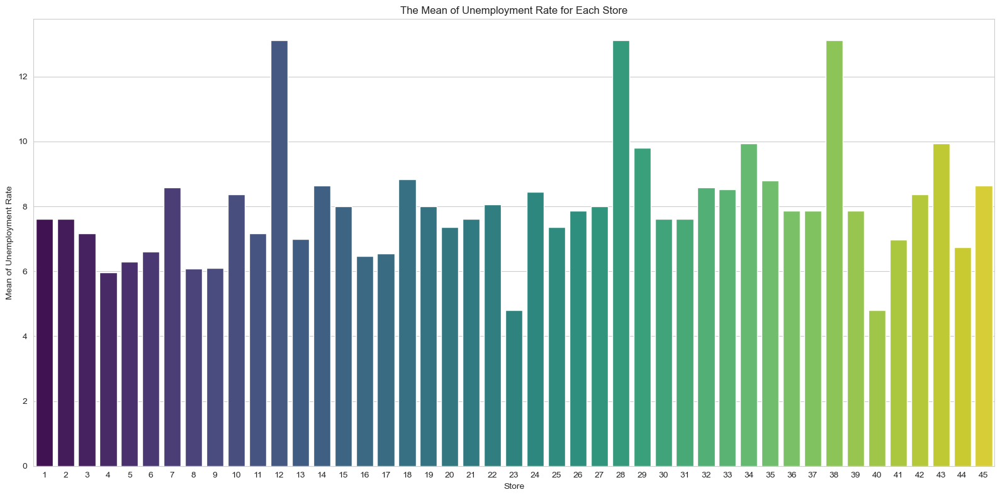

In [11]:
plt.figure(figsize=(16,8))
store_df2 = df.groupby("Store")["Unemployment"].mean().to_frame().reset_index()
sns.barplot(x=store_df2["Store"],y=store_df2["Unemployment"],palette="viridis")
plt.ylabel("Mean of Unemployment Rate")
plt.title("The Mean of Unemployment Rate for Each Store")
plt.tight_layout()

## b. If the weekly sales show a seasonal trend, when and what could be the reason?

### Stationarity test

In [12]:
from statsmodels.tsa.stattools import adfuller
# p-value>0.05 --> not stationary --> Null Hyp
# p-value<0.05 --> stationary --> Alt Hyp
result = adfuller(df['Weekly_Sales'])
p_value = result[1]
print(p_value)
if p_value<0.05:
    print('Stationary')
else:
    print('Not stationary')

0.00011655869699901115
Stationary


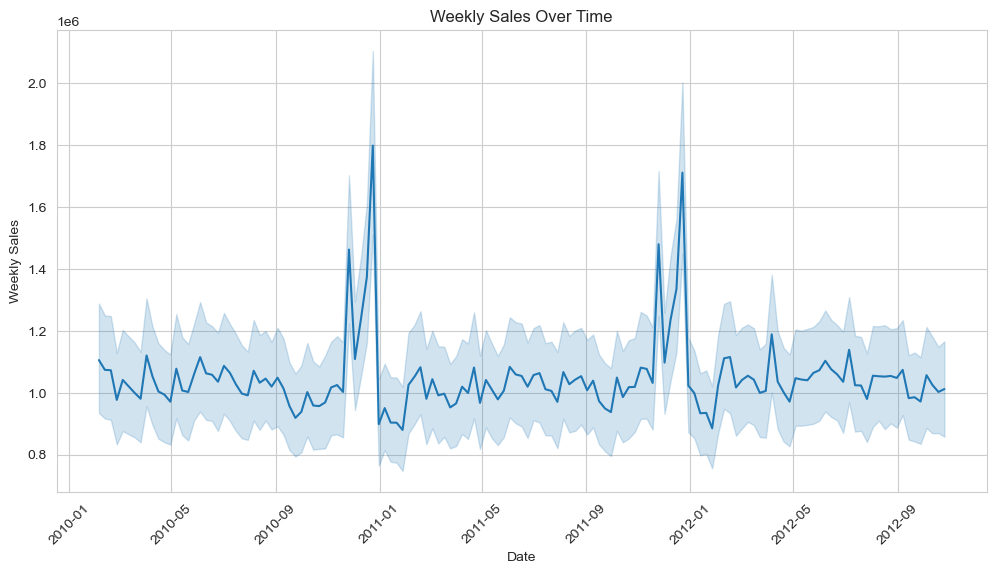

In [13]:
# Create a time series plot to visualize weekly sales over time
plt.figure(figsize=(12, 6))
sns.lineplot(x='Date', y='Weekly_Sales', data=df)
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.title('Weekly Sales Over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

## c. Does temperature affect the weekly sales in any manner?

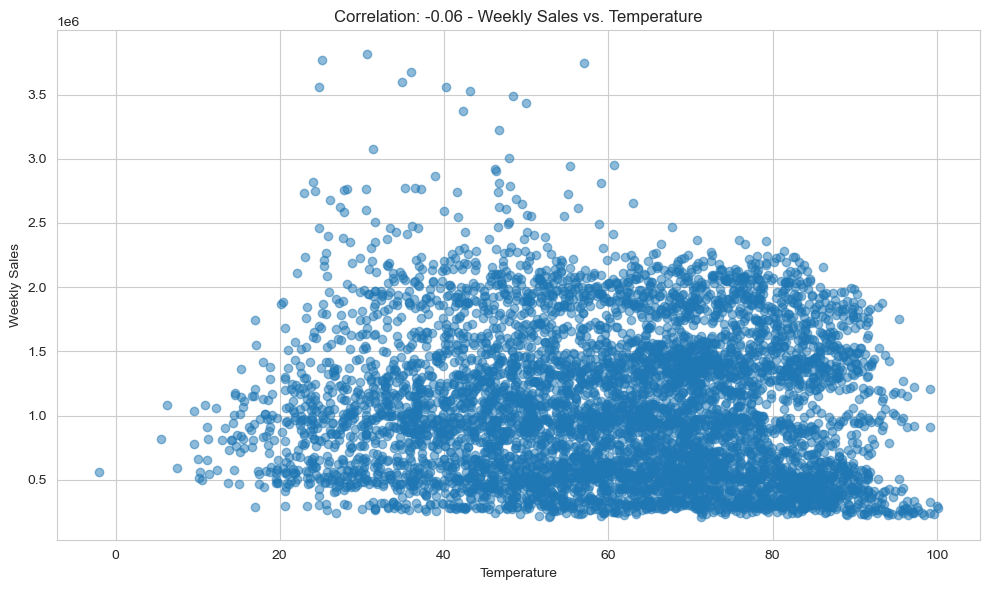

In [14]:
# Calculate the correlation between temperature and weekly sales
correlation_temp_sales = df[['Temperature', 'Weekly_Sales']].corr().iloc[0, 1]

# Create a scatter plot to visualize the relationship
plt.figure(figsize=(10, 6))
plt.scatter(df['Temperature'], df['Weekly_Sales'], alpha=0.5)
plt.xlabel('Temperature')
plt.ylabel('Weekly Sales')
plt.title(f'Correlation: {correlation_temp_sales:.2f} - Weekly Sales vs. Temperature')
plt.grid(True)

# Show the scatter plot
plt.tight_layout()
plt.show()

## d. How is the Consumer Price index affecting the weekly sales of various stores?

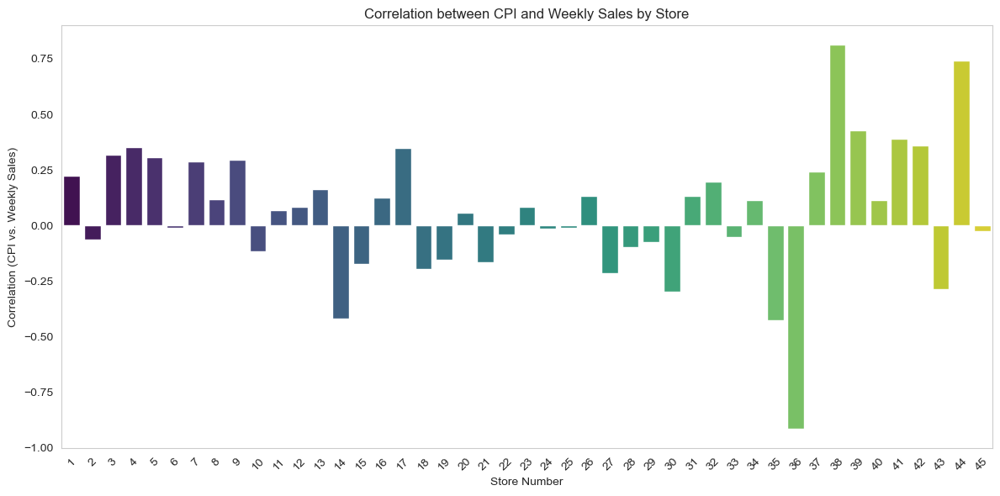

In [15]:
# Calculate the correlation between CPI and weekly sales for each store
correlation_by_store = df.groupby('Store')[['CPI', 'Weekly_Sales']].corr().iloc[0::2,-1].reset_index()


correlation_by_store = correlation_by_store.rename(columns={'level_1': 'Correlation'})
#correlation_by_store

# Sort stores by the strength of correlation
correlation_by_store1 = correlation_by_store.sort_values(by='Weekly_Sales', ascending=False)

# Create a bar chart to visualize the relationship
plt.figure(figsize=(12, 6))
sns.barplot(data=correlation_by_store1, x='Store', y='Weekly_Sales', palette='viridis')
plt.xlabel('Store Number')
plt.ylabel('Correlation (CPI vs. Weekly Sales)')
plt.title('Correlation between CPI and Weekly Sales by Store')
plt.xticks(rotation=45)  # Rotate store numbers for better readability
plt.grid(axis='y')

# Show the bar chart
plt.tight_layout()
plt.show()


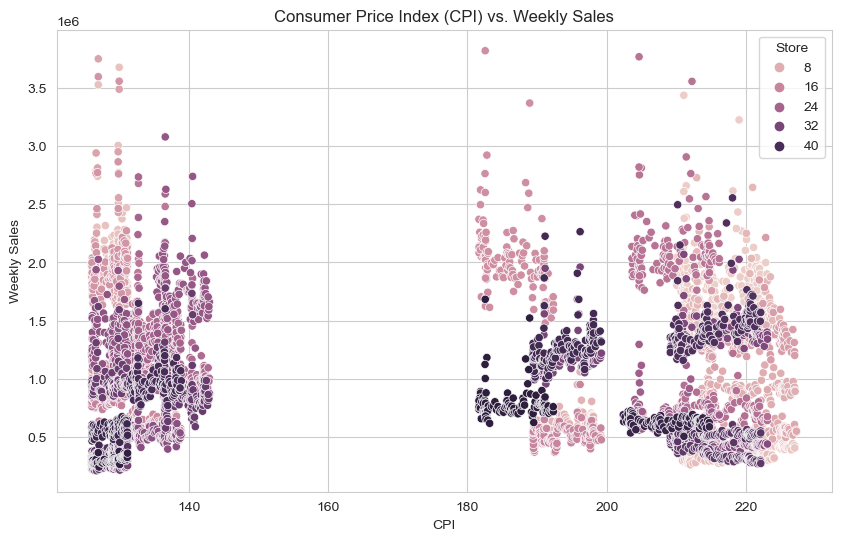

In [16]:
# Scatter plot to visualize the relationship between CPI and Weekly Sales
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='CPI', y='Weekly_Sales', hue='Store')
plt.title("Consumer Price Index (CPI) vs. Weekly Sales")
plt.xlabel("CPI")
plt.ylabel("Weekly Sales")
plt.show()

## e. Top performing stores according to the historical data.

Top 5 performing stores according to the historical data provided are: [20, 4, 14, 13, 2]
 The Worst 5 performing stores according to the historical data provided are: [38, 36, 5, 44, 33]


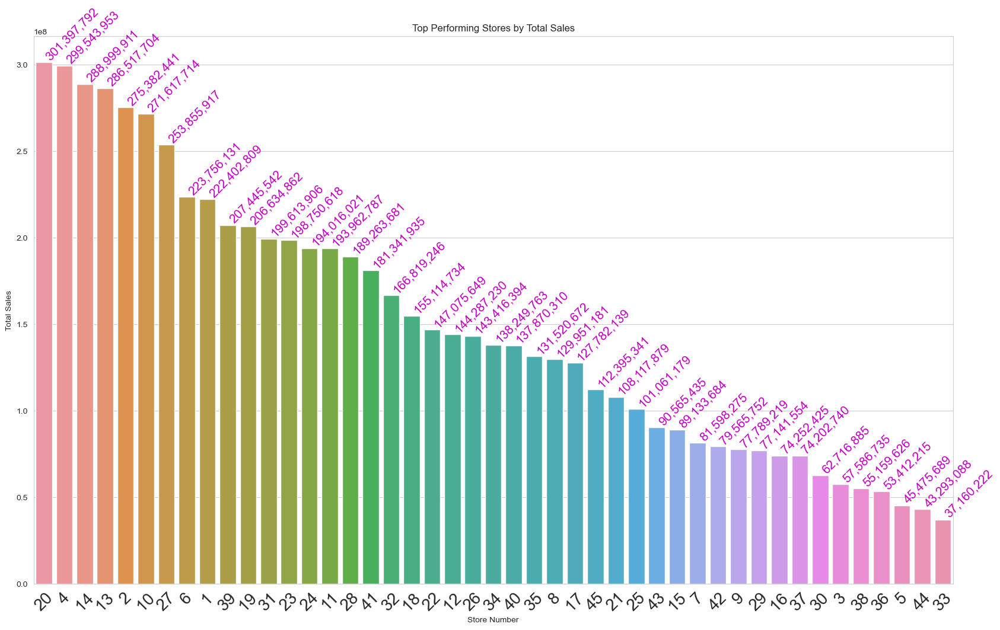

In [17]:
def top_performing_stores():
    grouped_stores = df.groupby('Store').agg(total_sales = ('Weekly_Sales','sum'),
                                            avg_sales = ('Weekly_Sales','mean')).sort_values(by = 'total_sales', ascending=False)
    plt.figure(figsize = (20,12))
    # order is not specified, then barplot arranges the xlabels in ascending order if they are of int type
    ax = sns.barplot(x= grouped_stores.index, y = grouped_stores['total_sales'], order = grouped_stores.index)
    
    plt.xticks(rotation = 45, fontsize = 20)
    plt.xlabel('Store Number')
    plt.ylabel('Total Sales')
    plt.title('Top Performing Stores by Total Sales')
    plt.xticks(rotation=45)  # Rotate store numbers for better readability
    for i, v in enumerate(grouped_stores['total_sales'].iteritems()):
        ax.text(i, v[1],"{:,}".format(round(v[1])), color = 'm', va = 'bottom', rotation = 45, fontsize = 15)
    print("Top 5 performing stores according to the historical data provided are:", grouped_stores.index.to_list()[:5])
    print(" The Worst 5 performing stores according to the historical data provided are:", grouped_stores.index.to_list()[-5:] )
    return grouped_stores

grouped_store_performance =  top_performing_stores()

## f. The worst performing store, and how significant is the difference between the highest and lowest performing stores.

In [18]:
# Calculate the total sales for each store
store_sales = df.groupby('Store')['Weekly_Sales'].sum().reset_index()

# Find the store with the lowest total sales
worst_performing_store = store_sales.loc[store_sales['Weekly_Sales'].idxmin()]

# Find the store with the highest total sales
best_performing_store = store_sales.loc[store_sales['Weekly_Sales'].idxmax()]

# Calculate the difference between the highest and lowest performing stores
difference = best_performing_store['Weekly_Sales'] - worst_performing_store['Weekly_Sales']

print("Worst Performing Store:")
print(worst_performing_store)

print("\nBest Performing Store:")
print(best_performing_store)

print("\nDifference between Highest and Lowest Performing Stores:")
print(difference)

Worst Performing Store:
Store                 33.00
Weekly_Sales    37160221.96
Name: 32, dtype: float64

Best Performing Store:
Store           2.000000e+01
Weekly_Sales    3.013978e+08
Name: 19, dtype: float64

Difference between Highest and Lowest Performing Stores:
264237570.49999997


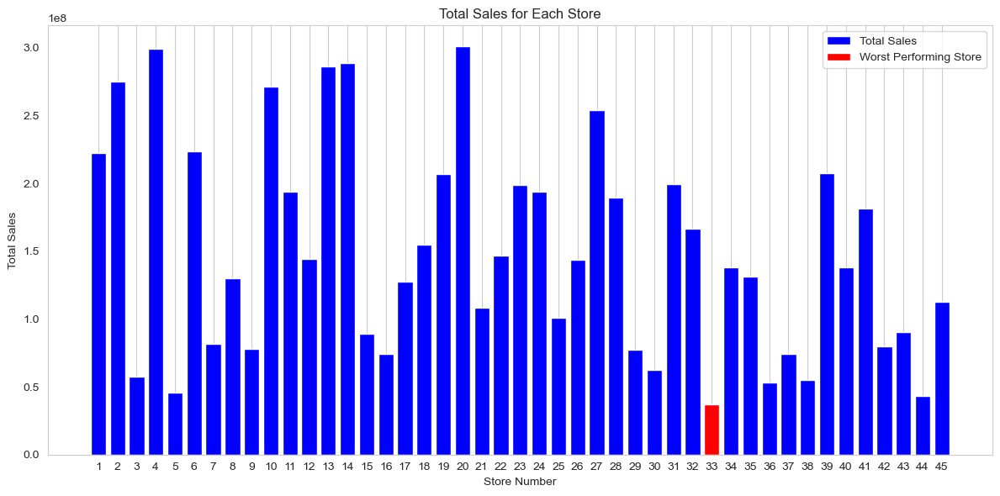

In [19]:
# Calculate the total sales for each store
store_sales = df.groupby('Store')['Weekly_Sales'].sum().reset_index()

# Find the store with the lowest total sales
worst_performing_store = store_sales.loc[store_sales['Weekly_Sales'].idxmin()]

# Create a bar chart to visualize the total sales for all stores
plt.figure(figsize=(12, 6))
plt.bar(store_sales['Store'], store_sales['Weekly_Sales'], color='b', label='Total Sales')
plt.xlabel('Store Number')
plt.ylabel('Total Sales')
plt.title('Total Sales for Each Store')
plt.xticks(store_sales['Store'])
plt.grid(axis='y')

# Highlight the worst-performing store with a different color
plt.bar(worst_performing_store['Store'], worst_performing_store['Weekly_Sales'], color='r', label='Worst Performing Store')
plt.legend()

# Show the bar chart
plt.tight_layout()
plt.show()

<Axes: xlabel='Date'>

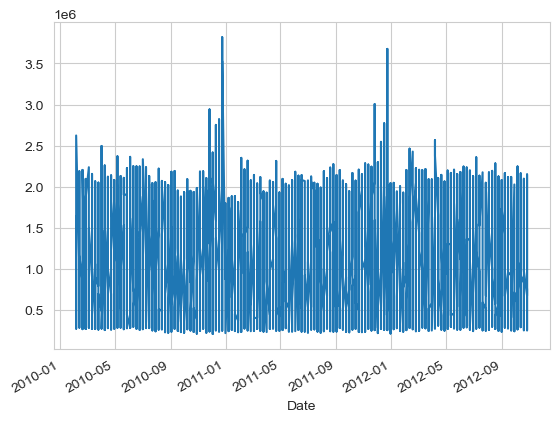

In [20]:
df['Weekly_Sales'].plot()

In [21]:
### ADD Day Month Year Week Day Name


In [22]:
### ADD Day Month Year Week Day Name
df1 = df.copy()
df1['Month'] = df.Date.dt.month
df1['Year'] = df.Date.dt.year
df1['Day'] = df.Date.dt.day
df1['day_name'] = df.Date.dt.day_name()
df1['week'] = df.Date.dt.isocalendar().week
df1.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Month,Year,Day,day_name,week
Date,,,,,,,,,,,,,
2010-02-05,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2,2010,5,Friday,5
2010-02-12,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2,2010,12,Friday,6
2010-02-19,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2,2010,19,Friday,7
2010-02-26,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2,2010,26,Friday,8
2010-03-05,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,3,2010,5,Friday,9


## EDA statistical Analysis

In [23]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6435 entries, 2010-02-05 to 2012-10-26
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
 8   Month         6435 non-null   int64         
 9   Year          6435 non-null   int64         
 10  Day           6435 non-null   int64         
 11  day_name      6435 non-null   object        
 12  week          6435 non-null   UInt32        
dtypes: UInt32(1), datetime64[ns](1), float64(5), int64(5), object(1)
memory usage: 685.0+ KB


In [24]:
#sns.lineplot(y='Weekly_Sales', x='Year', data=df1)

<Axes: xlabel='Month', ylabel='Weekly_Sales'>

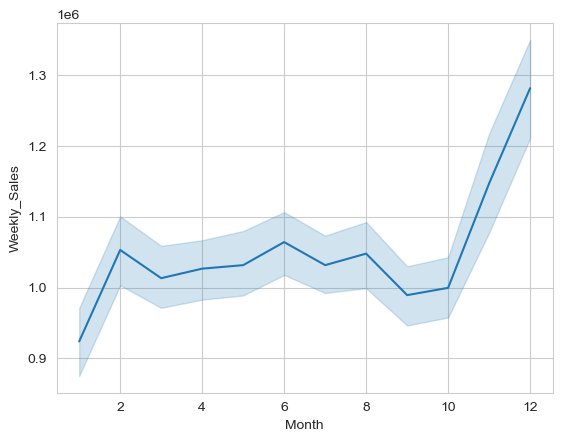

In [25]:
sns.lineplot(x='Month',y='Weekly_Sales', data=df1)

<Axes: xlabel='Month', ylabel='Weekly_Sales'>

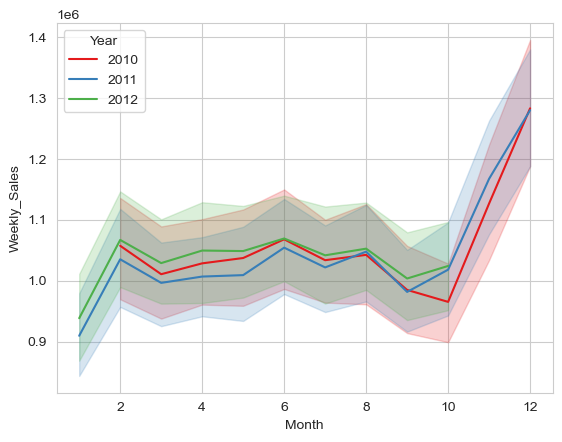

In [26]:
sns.lineplot(x='Month',y='Weekly_Sales', data=df1, hue='Year', palette='Set1')

<Axes: xlabel='Month', ylabel='Weekly_Sales'>

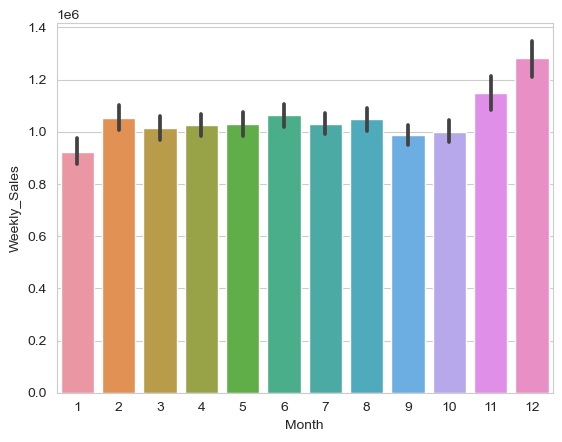

In [27]:
sns.barplot(x='Month',y='Weekly_Sales', data=df1)

<Axes: xlabel='week', ylabel='Weekly_Sales'>

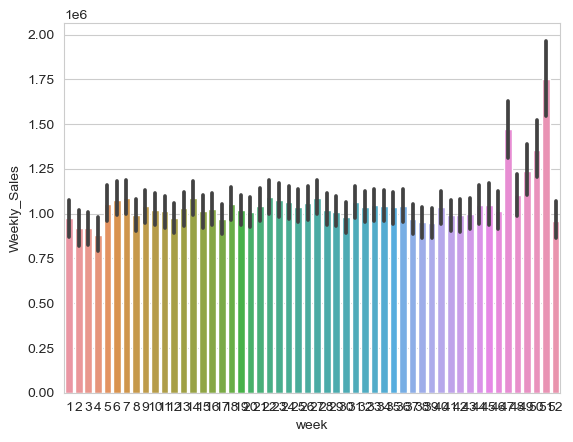

In [28]:
#plt.(2,4, figsize=(16,8))

sns.barplot(x='week',y='Weekly_Sales', data=df1)

In [29]:
col_list = df.columns
col_list

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment'],
      dtype='object')

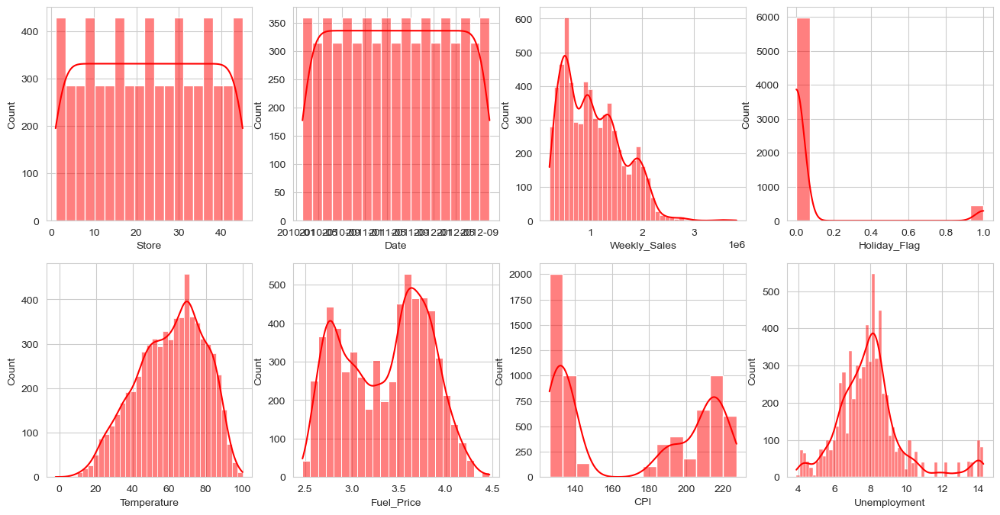

In [30]:

plt.subplots(2,4, figsize=(16,8))
i = 1
for col in col_list:
    plt.subplot(2,4,i)
    sns.histplot(df[col],kde=True,color='red')
    i += 1

### Seperating the dataframe based on the stores 

In [31]:
Stores = {}
for i in range(1,len(df.Store.unique())+1):
    Stores[i] = df1[df1['Store'] == i]

In [32]:
Stores

{1:             Store       Date  Weekly_Sales  Holiday_Flag  Temperature  \
 Date                                                                    
 2010-02-05      1 2010-02-05    1643690.90             0        42.31   
 2010-02-12      1 2010-02-12    1641957.44             1        38.51   
 2010-02-19      1 2010-02-19    1611968.17             0        39.93   
 2010-02-26      1 2010-02-26    1409727.59             0        46.63   
 2010-03-05      1 2010-03-05    1554806.68             0        46.50   
 ...           ...        ...           ...           ...          ...   
 2012-09-28      1 2012-09-28    1437059.26             0        76.08   
 2012-10-05      1 2012-10-05    1670785.97             0        68.55   
 2012-10-12      1 2012-10-12    1573072.81             0        62.99   
 2012-10-19      1 2012-10-19    1508068.77             0        67.97   
 2012-10-26      1 2012-10-26    1493659.74             0        69.16   
 
             Fuel_Price         C

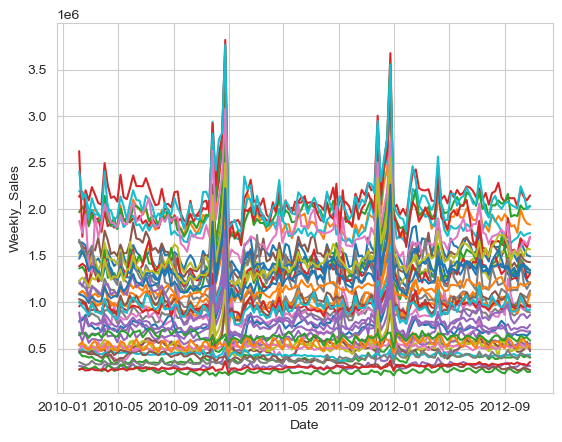

In [33]:
for i in range(1,46):
    sns.lineplot(data=Stores[i],y='Weekly_Sales', x='Date')

# Visualize all the stores

### Date vs Weekly_Sales of all 45 stores

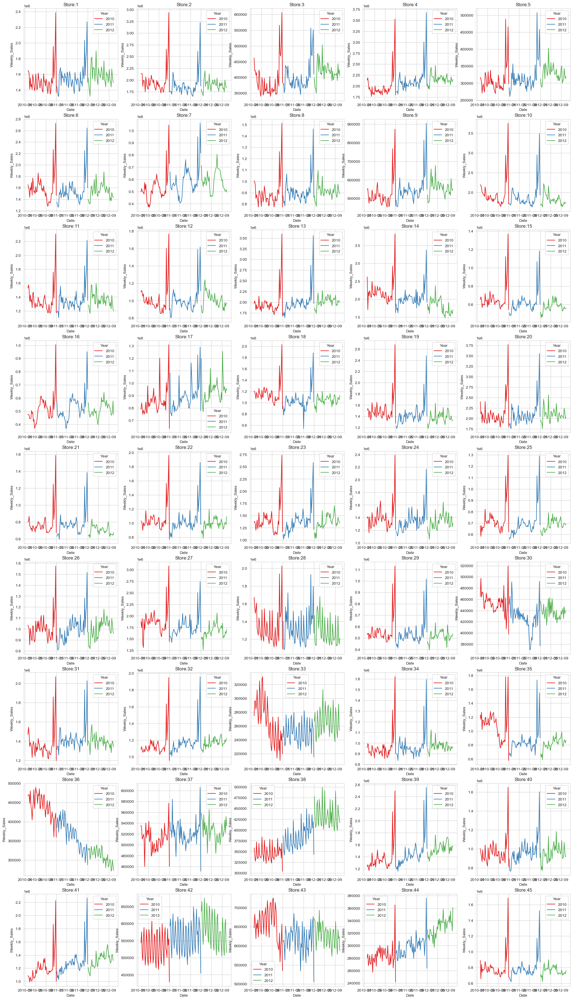

In [34]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.lineplot(x='Date', y='Weekly_Sales', data=Stores[i], hue='Year',palette='Set1')
    plt.title(f'Store:{i}')

### Temperature vs Weekly_Sales

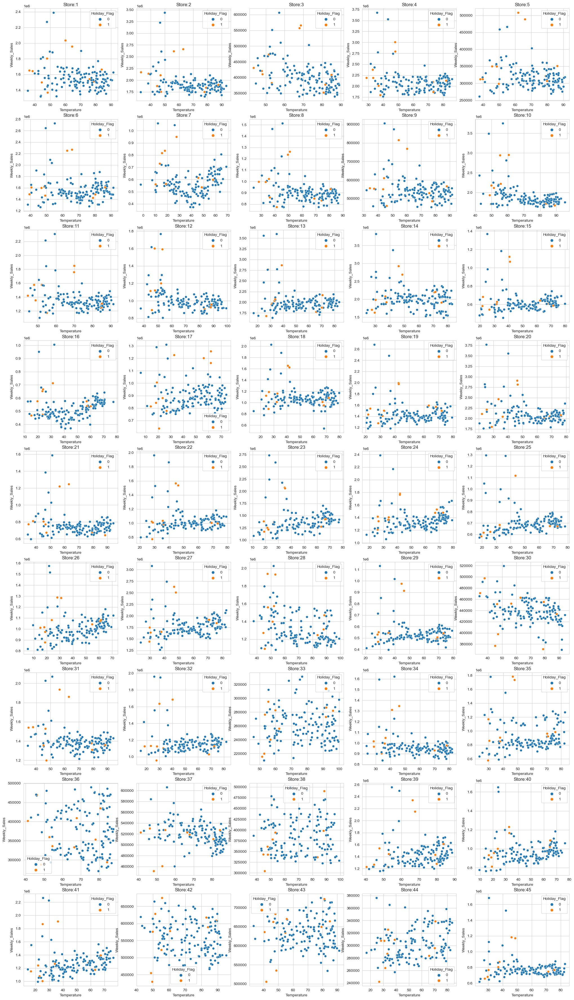

In [35]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.scatterplot(x='Temperature', y='Weekly_Sales', data=Stores[i], hue='Holiday_Flag')
    plt.title(f'Store:{i}')

### CPI vs Weekly_Sales

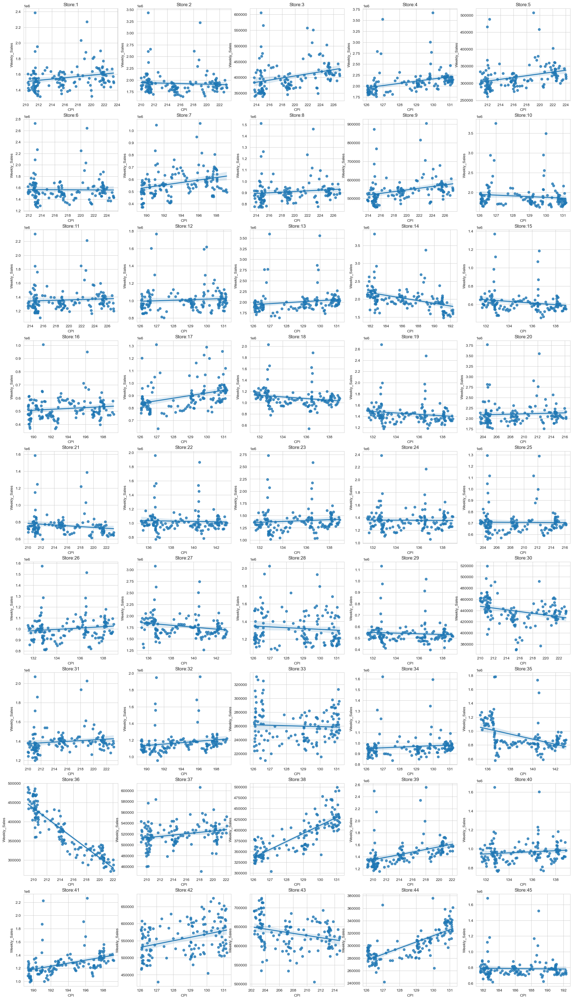

In [36]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.regplot(x='CPI', y='Weekly_Sales', data=Stores[i])
    plt.title(f'Store:{i}')

### Unemployment vs Weekly_Sales

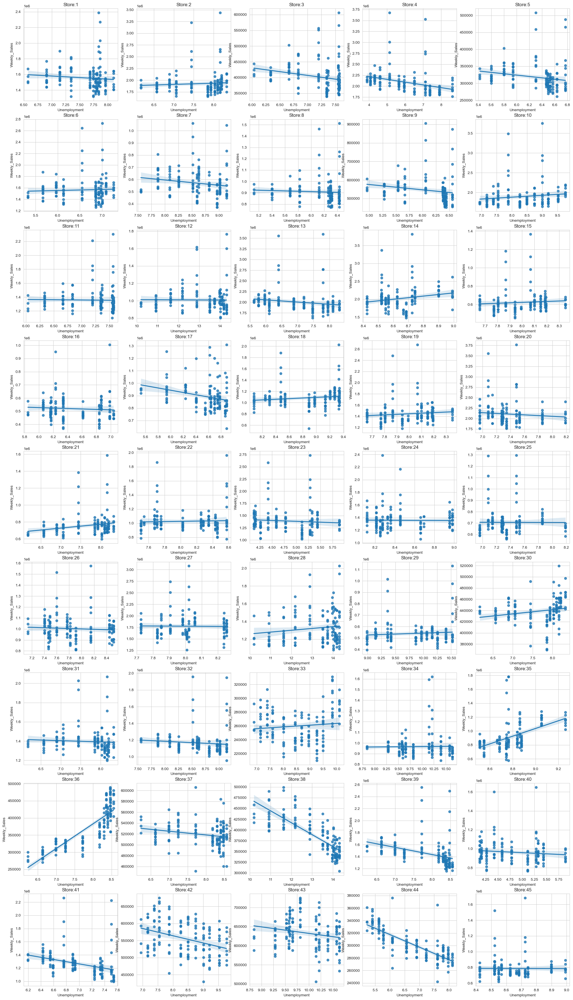

In [37]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.regplot(x='Unemployment', y='Weekly_Sales', data=Stores[i])
    plt.title(f'Store:{i}')

# Time series and Forecasting

In [38]:
df1 = Stores[1]
df1 = df1.loc[:,['Date', 'Weekly_Sales']]
df1.index = df1['Date']
df1.drop(['Date'], axis=1, inplace=True)
df1.head()

,Weekly_Sales
Date,
2010-02-05,1643690.90
2010-02-12,1641957.44
2010-02-19,1611968.17
2010-02-26,1409727.59
2010-03-05,1554806.68


In [39]:
df1.shape

(143, 1)

<Axes: xlabel='Date'>

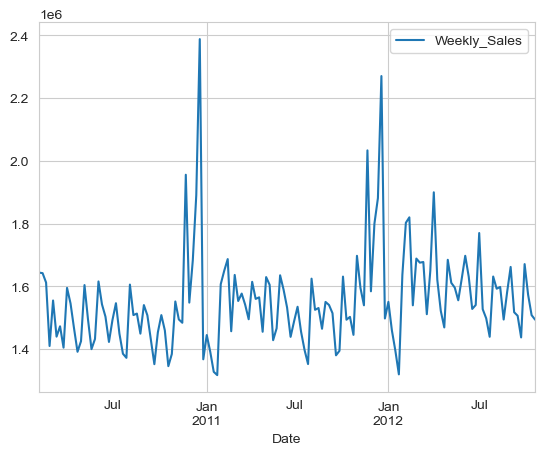

In [40]:
df1.plot()

### Stationarity test

In [41]:
from statsmodels.tsa.stattools import adfuller
# p-value>0.05 --> not stationary --> Null Hyp
# p-value<0.05 --> stationary --> Alt Hyp
result = adfuller(df1['Weekly_Sales'])
p_value = result[1]
print(p_value)
if p_value<0.05:
    print('Stationary')
else:
    print('Not stationary')

1.3877788330759434e-05
Stationary


In [42]:
# KPSS test( Kwiatkowski–Phillips–Schmidt–Shin test)
from statsmodels.tsa.stattools import kpss
stats,p,lags,critical = kpss(df1['Weekly_Sales'])
if p>0.05:
    print('Stationary')
else:
    print('Not stationary')
print(p)

Not stationary
0.047095888148842614


Seasionality of this data is one year, so we take window 52 (52 weeks per year).

In [43]:
rolling_mean = df1.rolling(window=52).mean()
rolling_mean

,Weekly_Sales
Date,
2010-02-05,NaN
2010-02-12,NaN
2010-02-19,NaN
2010-02-26,NaN
2010-03-05,NaN
...,...
2012-09-28,1.613969e+06
2012-10-05,1.614734e+06
2012-10-12,1.616264e+06


### Removing the trend from the timestamp if trend is present

In [44]:
rolling_mean_detrended = df1-rolling_mean
rolling_mean_detrended

,Weekly_Sales
Date,
2010-02-05,NaN
2010-02-12,NaN
2010-02-19,NaN
2010-02-26,NaN
2010-03-05,NaN
...,...
2012-09-28,-176909.317308
2012-10-05,56052.084615
2012-10-12,-43190.823077


<Axes: xlabel='Date'>

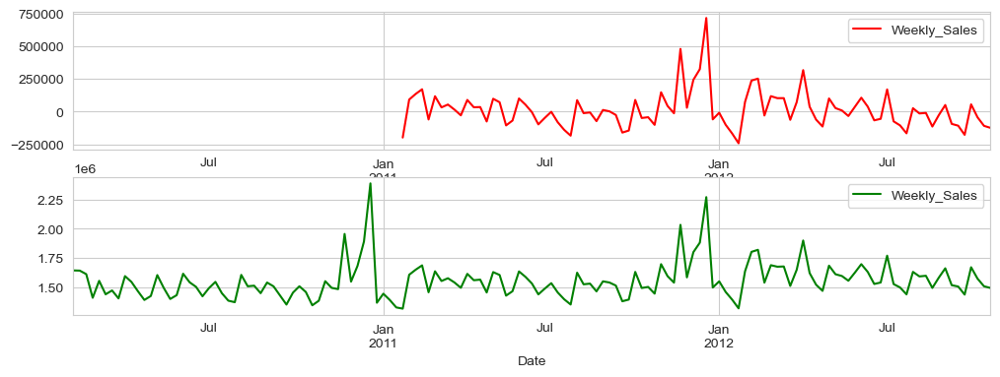

In [45]:
ax1 = plt.subplot(211)
rolling_mean_detrended.plot(figsize=(12,4),color='red',ax=ax1)
ax2 = plt.subplot(212)
df1.plot(figsize=(12,4),color='green',ax=ax2)

### Removing seasonality

In [46]:
from statsmodels.tsa.seasonal import seasonal_decompose
decompose_result = seasonal_decompose(rolling_mean_detrended.dropna(), period=25)

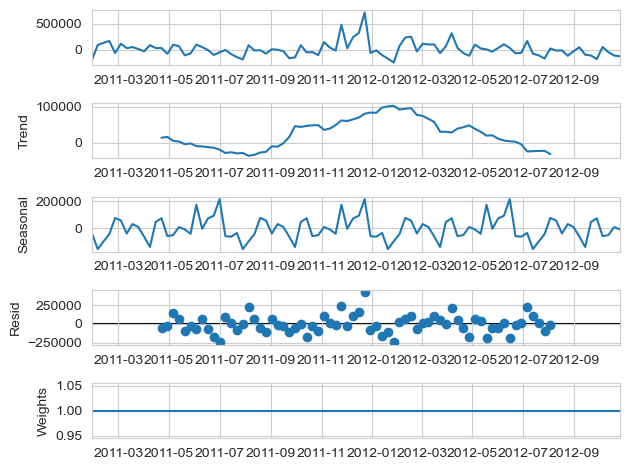

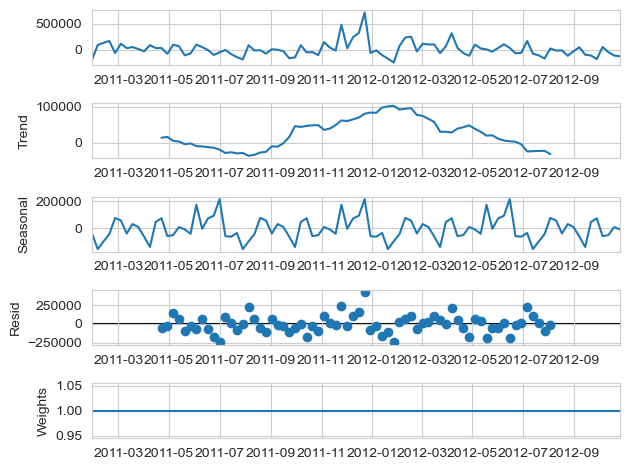

In [47]:
decompose_result.plot(weights=True)

In [48]:
# removing seasionality
rolling_mean_decomposed_diff = rolling_mean_detrended - rolling_mean_detrended.shift()
rolling_mean_decomposed_diff

,Weekly_Sales
Date,
2010-02-05,NaN
2010-02-12,NaN
2010-02-19,NaN
2010-02-26,NaN
2010-03-05,NaN
...,...
2012-09-28,-69884.058269
2012-10-05,232961.401923
2012-10-12,-99242.907692


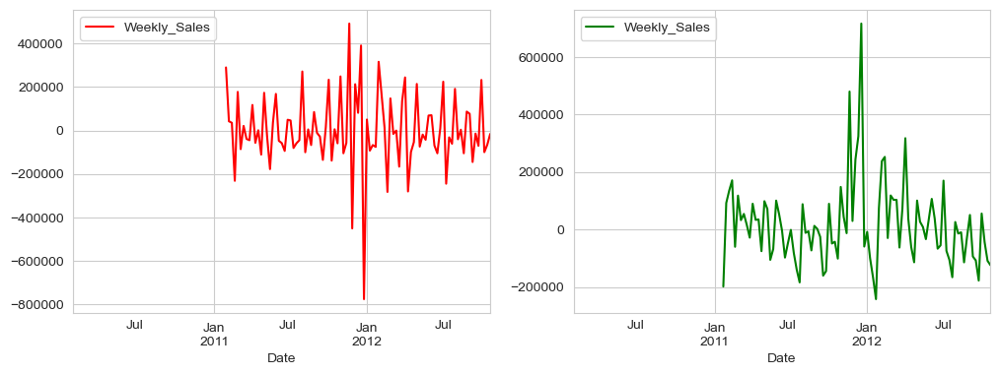

In [49]:
ax1=plt.subplot(121)
rolling_mean_decomposed_diff.plot(figsize=(12,4),color='red',ax=ax1)
ax2=plt.subplot(122)
rolling_mean_detrended.plot(figsize=(12,4),color='green',ax=ax2)
plt.show()

In [50]:
rolling_mean_decomposed_diff.dropna(inplace=True)
rolling_mean_decomposed_diff

,Weekly_Sales
Date,
2011-02-04,290442.987692
2011-02-11,42838.090577
2011-02-18,35787.953654
2011-02-25,-230947.744038
2011-03-04,177896.654423
...,...
2012-09-28,-69884.058269
2012-10-05,232961.401923
2012-10-12,-99242.907692


In [51]:
final = adfuller(rolling_mean_decomposed_diff['Weekly_Sales'])
final[1]

3.257853293563764e-07

### Visualize ACF and PACF to choose the Times seris model

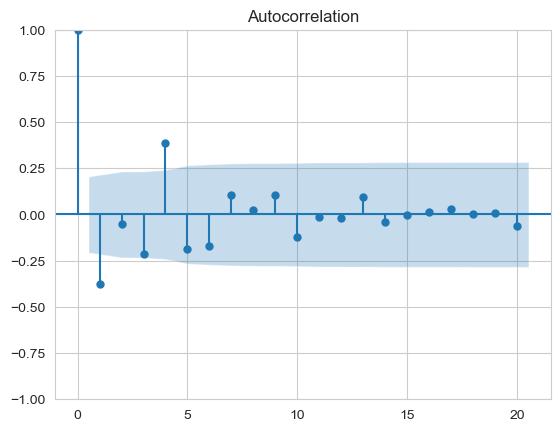

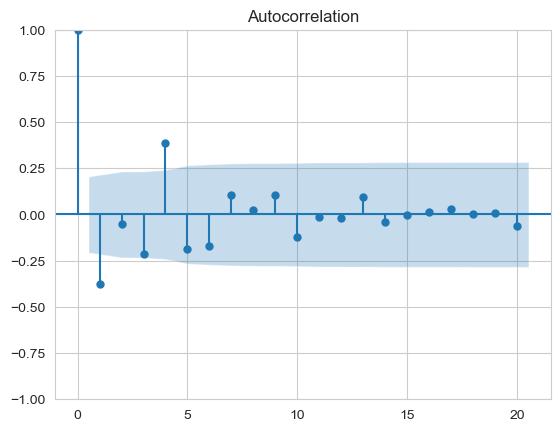

In [52]:
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(rolling_mean_decomposed_diff['Weekly_Sales'])

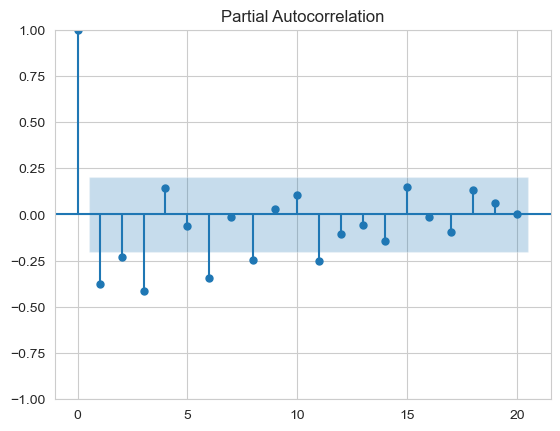

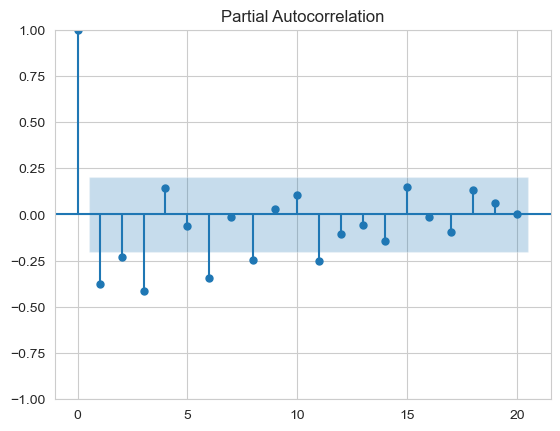

In [53]:
plot_pacf(rolling_mean_decomposed_diff['Weekly_Sales'])

### Choosing the best model using autoarima

In [54]:
! pip install pmdarima
from pmdarima import auto_arima
order = auto_arima(rolling_mean_decomposed_diff['Weekly_Sales'],trace=True)
order.summary()

Defaulting to user installation because normal site-packages is not writeable
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2428.230, Time=0.15 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2454.958, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2442.923, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2426.044, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2452.960, Time=0.03 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2426.893, Time=0.05 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2426.900, Time=0.04 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2428.257, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2422.325, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2421.076, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2440.908, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.10 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2424.524, Time=0.08 sec
 ARIMA(0,0,2)(0,0,0)[0]   

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   91
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -1207.538
Date:                Thu, 07 Sep 2023   AIC                           2421.076
Time:                        20:55:19   BIC                           2428.608
Sample:                    02-04-2011   HQIC                          2424.115
                         - 10-26-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2370      0.116      2.050      0.040       0.010       0.464
ma.L1         -0.9361      0.054    -17.315      0.000      -1.042      -0.830
sigma2      2.002e+10   7.21e-13   2.78e+22      0.000       2e+10       2e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                83.49
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):               1.21   Skew:                             1.39
Prob(H) (two-sided):                  0.61   Kurtosis:                         6.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.29e+38. Standard errors may be unstable.
"""

In [55]:
from statsmodels.tsa.arima.model import ARIMA

train = rolling_mean_decomposed_diff.iloc[:73]['Weekly_Sales']
test = rolling_mean_decomposed_diff.iloc[73:]['Weekly_Sales']
# ARIMA ---> AR + MA +I ---> ARIMA--> AR=1 , I=0 , MA=1
model = ARIMA(train, order=(1,0,1))
model_fit = model.fit() # training 
model_fit.summary()

C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           Weekly_Sales   No. Observations:                   73
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -972.872
Date:                Thu, 07 Sep 2023   AIC                           1953.744
Time:                        20:55:19   BIC                           1962.906
Sample:                    02-04-2011   HQIC                          1957.395
                         - 06-22-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1802.9196   1363.342      1.322      0.186    -869.181    4475.021
ar.L1          0.2757      0.095      2.912      0.004       0.090       0.461
ma.L1         -0.9892      0.131     -7.572      0.000      -1.245      -0.733
sigma2      2.317e+10   4.19e-05   5.53e+14      0.000    2.32e+10    2.32e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                55.00
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):               1.84   Skew:                             1.34
Prob(H) (two-sided):                  0.14   Kurtosis:                         6.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.06e+31. Standard errors may be unstable.
"""

In [56]:
rolling_mean_decomposed_diff['Predict'] = model_fit.predict(start= len(train), 
                                    end=len(train)+len(test)- 1, 
                                    dynamic=True)
rolling_mean_decomposed_diff['Predict']

Date
2011-02-04            NaN
2011-02-11            NaN
2011-02-18            NaN
2011-02-25            NaN
2011-03-04            NaN
                 ...     
2012-09-28    1802.925716
2012-10-05    1802.921273
2012-10-12    1802.920048
2012-10-19    1802.919710
2012-10-26    1802.919617
Name: Predict, Length: 91, dtype: float64

<Axes: xlabel='Date'>

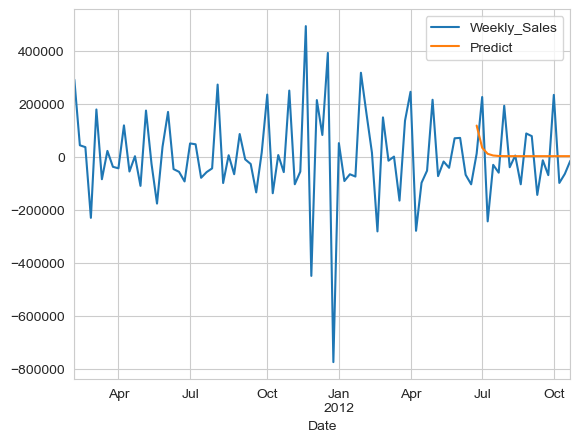

In [57]:
rolling_mean_decomposed_diff[['Weekly_Sales','Predict']].plot()

ARIMA model is not worling well, so we are going to use SARIMAX model on the same order

In [58]:
from statsmodels.tsa.statespace.sarimax import SARIMAX,SARIMAXResults

model=SARIMAX(train,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
model=model.fit()

C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Axes: xlabel='Date'>

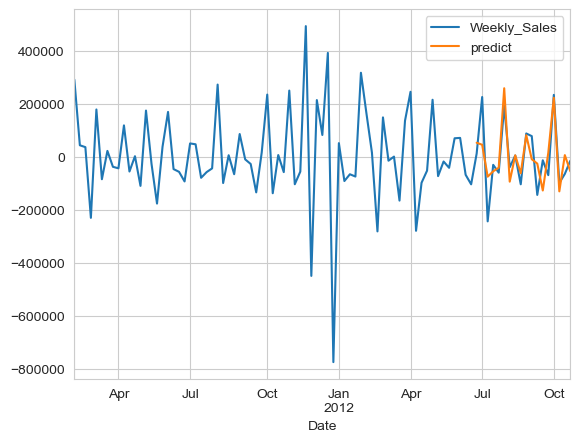

In [59]:
rolling_mean_decomposed_diff['predict'] = model.predict(start= len(train) ,
                                                       end=len(train)+len(test)- 1, 
                                                       dynamic=True)
rolling_mean_decomposed_diff[['Weekly_Sales','predict']].plot()

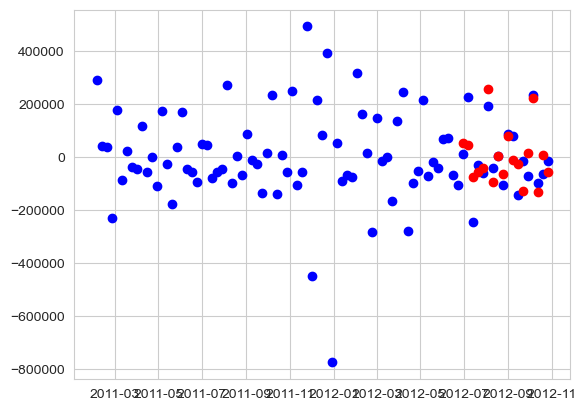

In [60]:
plt.plot(rolling_mean_decomposed_diff['Weekly_Sales'],'bo')
plt.plot(rolling_mean_decomposed_diff['predict'],'ro')

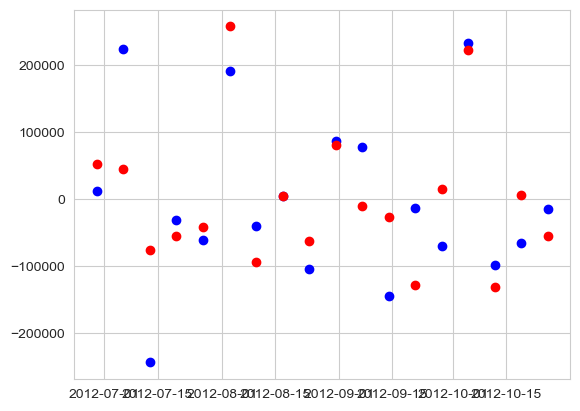

In [61]:
plt.plot(test,'bo')
plt.plot(rolling_mean_decomposed_diff['predict'],'ro')

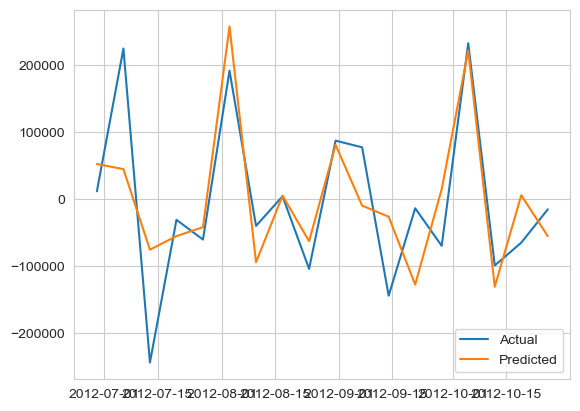

In [62]:
plt.plot(test, label='Actual')
plt.plot(rolling_mean_decomposed_diff['predict'], label='Predicted')
plt.legend()

We can check the model performance from the above graph, it predicted nearly possible values. 

In [63]:
rolling_mean_decomposed_diff.drop('Predict',axis=1, inplace=True)

<Axes: xlabel='Date'>

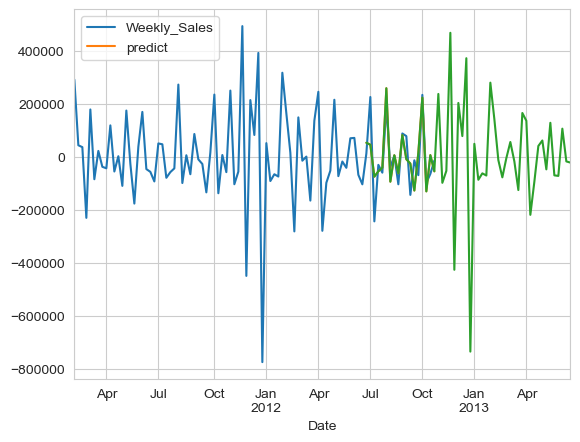

In [64]:
#predicting the projections for the next 1 year

forecast = model.forecast(steps=52)
rolling_mean_decomposed_diff.plot()
forecast.plot()

From the above graph we can conclude that this model predicted the sales approximatly 90%

### Checking the metrics

In [65]:
from sklearn.metrics import mean_absolute_error

y_train=train
y_true = test
y_pred = rolling_mean_decomposed_diff['predict'].dropna()

def mean_absolute_scaled_error(y_true, y_pred, y_train):
    e_t = y_true - y_pred
    scale = mean_absolute_error(y_train[1:], y_train[:-1])
    return np.mean(np.abs(e_t / scale))

print('Mean absolute scaled error of this SARIMAX model is ',mean_absolute_scaled_error(y_true, y_pred, y_train))

Mean absolute scaled error of this SARIMAX model is  0.3105465545534387


Lets check this model with another store

### Lets check with randomly selected different stores

In [66]:
results = {}
for i in np.random.randint(1,45,5):
    store = Stores[i]
    store = store.loc[:,['Date','Weekly_Sales']]
    store.index = store['Date']
    store.drop(['Date'],axis=1,inplace=True)
    model=SARIMAX(store,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
    model=model.fit()
    predict = model.predict(start= len(store) ,end=len(store)+12, dynamic=True)
    results[i] = predict

C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI w

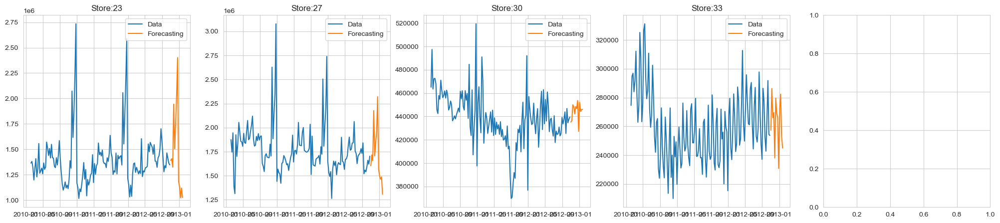

In [67]:
plt.subplots(1,5, figsize=(25,5))
i = 1
for value in results.keys():
    store=Stores[value]
    store = store.loc[:,['Date','Weekly_Sales']]
    store.index = store['Date']
    store.drop(['Date'],axis=1, inplace=True)
    result = results[value]
    plt.subplot(1,5,i)
    plt.plot(store, label='Data')
    plt.plot(result, label='Forecasting')
    plt.title(f'Store:{value}')
    plt.legend()
    i += 1

From the above graph we can see that this model forecasted the future sales approximately as same as the data set regarding the seasionality

### Lets forecast next 12 weeks of sales for each stores

In [ ]:
predictions = {}
for i in range(1,len(df.Store.unique())+1):
    store = Stores[i]
    store = store.loc[:,['Date','Weekly_Sales']]
    store.index = store['Date']
    store.drop(['Date'],axis=1,inplace=True)
    model=SARIMAX(store,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
    model=model.fit()
    predict = model.predict(start= len(store) ,end=len(store)+12, dynamic=True)
    predictions[i] = predict

C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI w

In [ ]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    store=Stores[i]
    store = store.loc[:,['Date','Weekly_Sales']]
    store.index = store['Date']
    store.drop(['Date'],axis=1, inplace=True)
    predict = predictions[i]
    plt.subplot(9,5,i)
    plt.plot(store,label='Data')
    plt.plot(predict,label='Forecast')
    plt.title(f'Store:{i}')
    plt.legend()

### Conclusion

#### From the above graph we can see that the Stores 14,20,28,30,31,37,44 are having poor forecasting. Overall 38 stores out of 45 are forecasted well successfully using the SARIMAX model with the order = (1,0,1) and seasonal order = (1,0,1,52). The Mean Absolute Scaled error of this model is 0.3.